## Imports

In [1]:
import os
import io
import cv2
import pytesseract
import keras_ocr
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline

from glob import glob
from google.cloud import vision
from PIL import Image, ImageDraw
from pytesseract import Output
from pytesseract import pytesseract as pt

/opt/conda/lib/python3.9/site-packages/pkg_resources/__init__.py:122: PkgResourcesDeprecationWarning: 0.996-ko-0.9.2 is an invalid version and will not be supported in a future release
  warnings.warn(


## Data preparation

In [2]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/'
images_path = glob(work_dir + '*.jpg')
images_path

['/aiffel/aiffel/ocr_python/jon-tyson-039N80FUbVQ-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/denise-jans-laoBHO09sU0-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/felicia-buitenwerf-5yn5rGI5IUw-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/randalyn-hill-Z1HXJQ2aWIA-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/stefan-cosma-0gO3-b-5m80-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/jordan-whitfield-sm3Ub_IJKQg-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/claudio-schwarz-xMCbZ6i4q6w-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/fab-lentz-mRMQwK513hY-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/peter-olexa--Y1TNa5l3q4-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/laura-chouette-tEkbCyw40es-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/nathan-dumlao-7woSCk0rZtw-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/mark-adriane-muS2RraYRuQ-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/rob-coates-LO7JT0Cb9Z8-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/logan-weaver-lgnwvr-78iLIC2FUdA-unsplash.jpg',
 '/aiffel/aiffel/ocr_python/sigmun

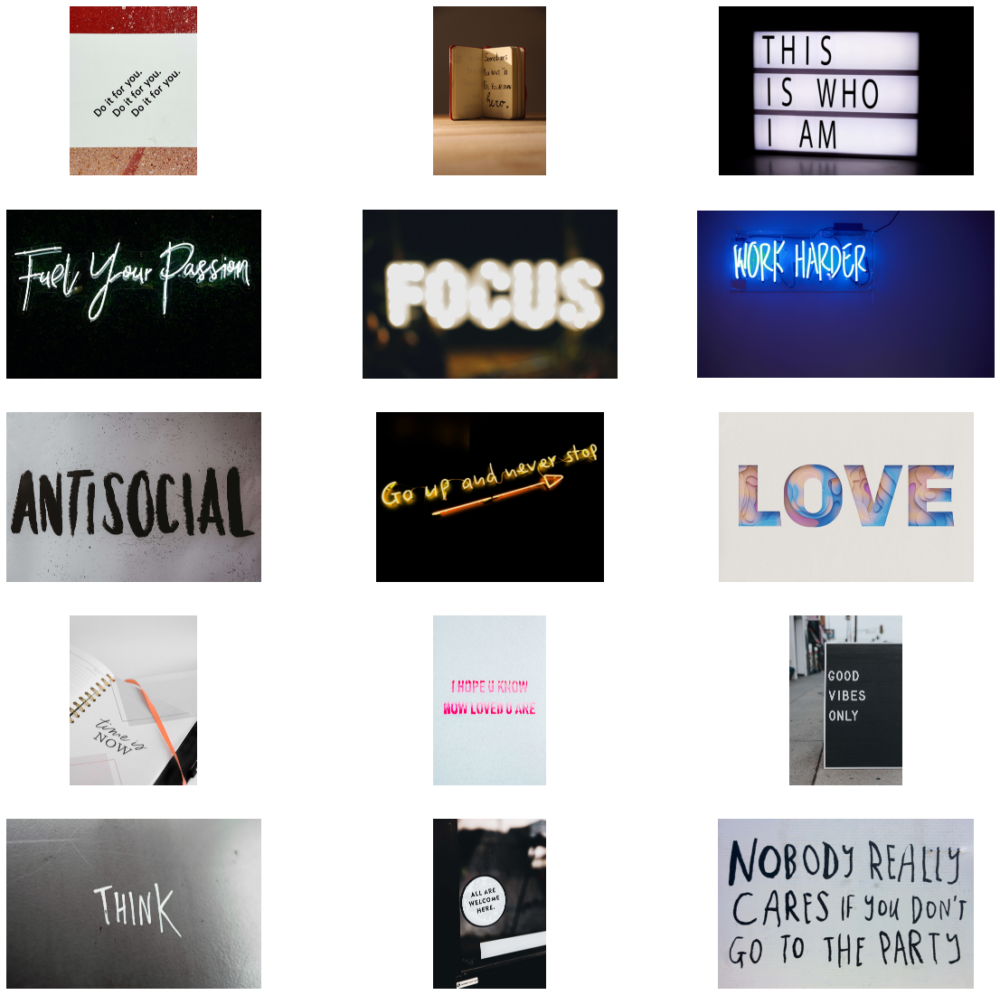

In [3]:
plt.figure(figsize=(20,20))

for idx, im in enumerate(images_path):
    plt.subplot(5, 3, idx+1)
    im = img.imread(im)
    plt.imshow(im)
    plt.axis('off')

## Google OCR

In [3]:
def draw_boxes(image, bounds, color):
    """Draw a border around the image using the hints in the vector list."""
    draw = ImageDraw.Draw(image)
    
    for bound in bounds:
        draw.line((
            (bound.vertices[0].x, bound.vertices[0].y),
            (bound.vertices[1].x, bound.vertices[1].y),
            (bound.vertices[2].x, bound.vertices[2].y),
            (bound.vertices[3].x, bound.vertices[3].y),
            (bound.vertices[0].x, bound.vertices[0].y)), fill = 'red', width = 25)
    return image

In [4]:
def detect_text(path):
    """Detects text in the file."""
    text_dec = []
    bounds = []
    client = vision.ImageAnnotatorClient()
    
    with io.open(path, 'rb') as image_file:
        content = image_file.read()
    
    s = os.path.splitext(path)
    s = os.path.split(s[0])
    name = s[1]
    
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations

    for text in texts:
        text_dec.append(text.description.replace('\n',''))
        vertices = text.bounding_poly
        bounds.append(vertices)
    
    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))
        
    return name, text_dec, bounds

In [5]:
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/algebraic-cycle-352802-be60b5725757.json'
!ls -l $GOOGLE_APPLICATION_CREDENTIALS
ocr_img = []
ocr_dict = {}

for path in images_path:
    name, text_dec, bounds = detect_text(path)
    ocr_dict[name] = text_dec
    image = Image.open(path)
    image = draw_boxes(image, bounds, 'red')
    ocr_img.append(image)

-rw-r--r-- 1 root root 2341 Jun  9 07:10 /aiffel/aiffel/ocr_python/algebraic-cycle-352802-be60b5725757.json


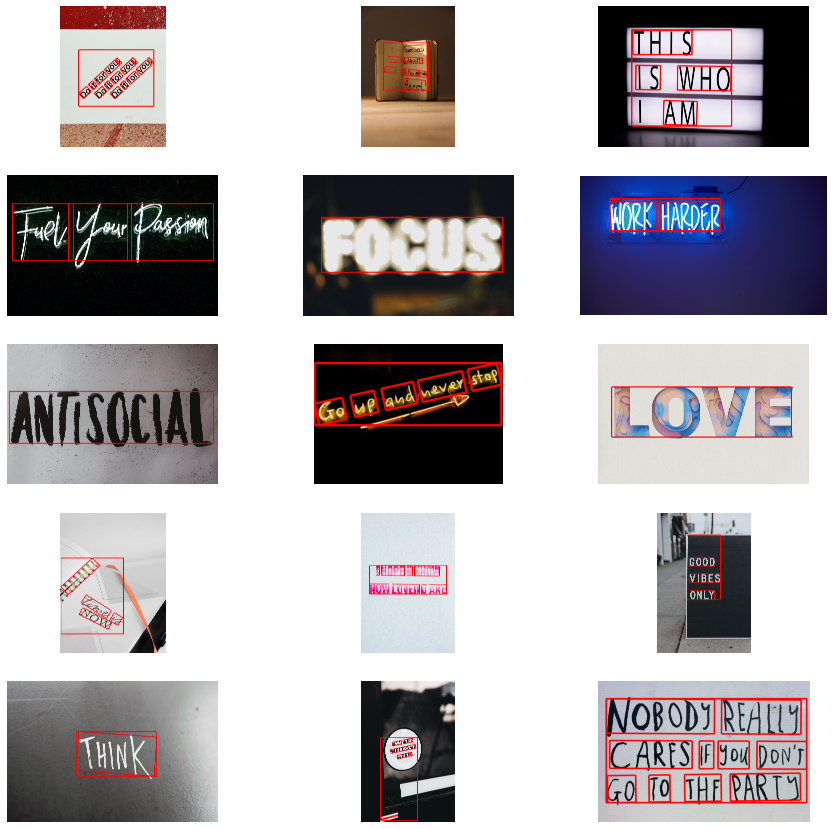

In [6]:
plt.figure(figsize=(15, 15))

for idx, img in enumerate(ocr_img):
    plt.subplot(5, 3, idx+1)
    plt.imshow(img)
    plt.axis('off')

## Keras OCR

In [3]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


In [4]:
images = [ keras_ocr.tools.read(im) for im in images_path]
predictions = [pipeline.recognize([im]) for im in images_path]

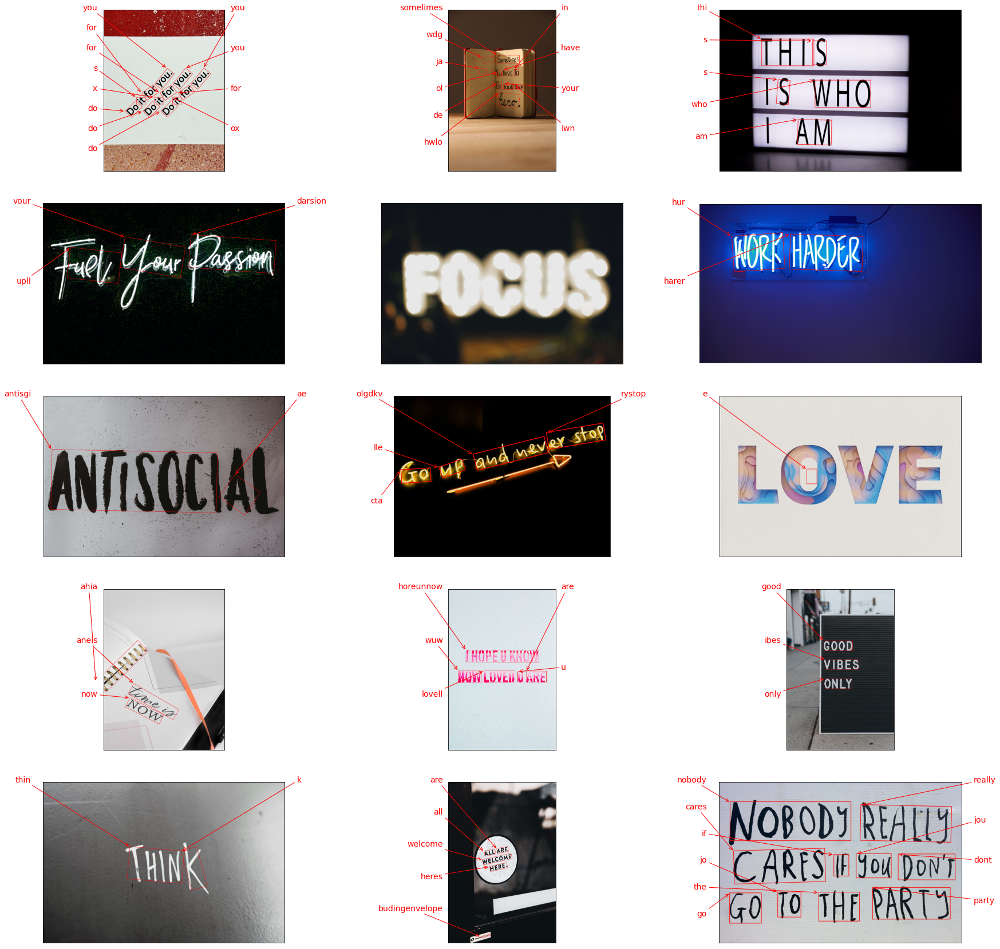

In [8]:
fig, axs = plt.subplots(5, 3, figsize=(30, 30))

for a in range(len(axs)):
    for b in range(len(axs[a])):
        keras_ocr.tools.drawAnnotations(image=images[3*a+b], 
                                    predictions=predictions[3*a+b][0], ax=axs[a,b])

## Tesseract

In [3]:
def crop_word_regions(image_path, output_path):
    s = os.path.splitext(image_path)
    s = os.path.split(s[0])
    name = s[1]
    output_path = output_path + name +'/'
    
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 11'
    image = Image.open(image_path)
    img = cv2.imread(image_path)
    
    d = pt.image_to_data(
        image, lang='eng',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    n_boxes = len(d['text'])
    for i in range(n_boxes):
        if int(d['conf'][i]) > 60:
            (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
            img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
            plt.imshow(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    top_level = max(d['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(d['level'])):
        level = d['level'][i]
    
        if level == top_level:
            left = d['left'][i]
            top = d['top'][i]
            width = d['width'][i]
            height = d['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return name, cropped_image_path_list, img

In [4]:
image = Image.open(images_path[0])
img = cv2.imread(images_path[0])

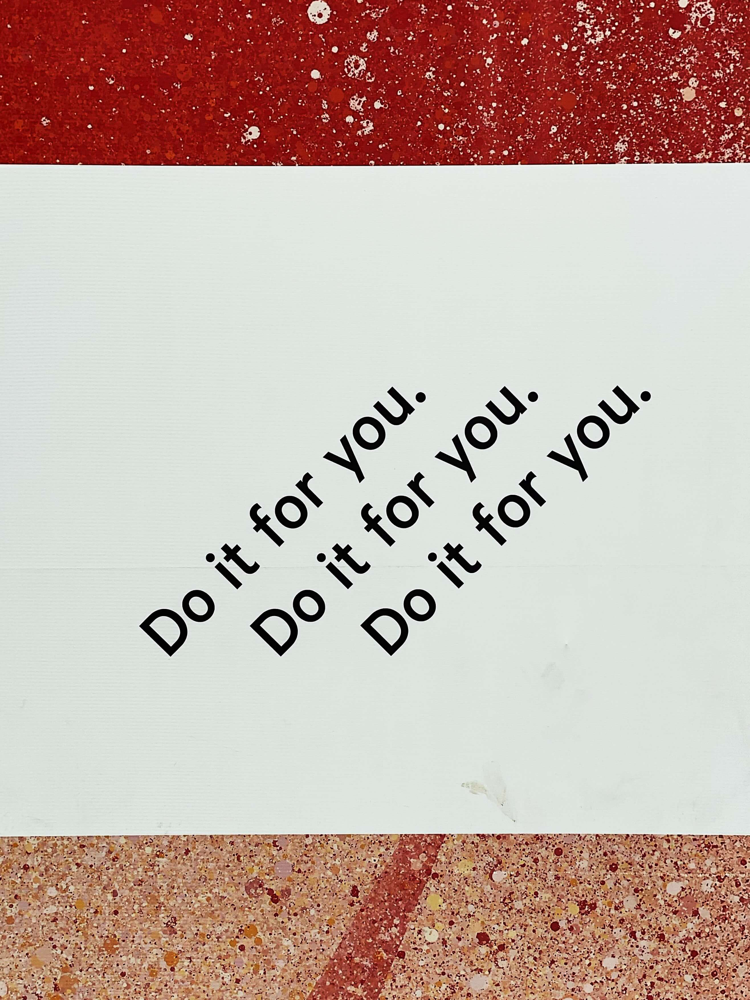

In [5]:
image

In [3]:
image = Image.open(images_path[0])
text = pt.image_to_boxes(image).split("\n")
images_path[0]

In [21]:
def crop_word_regions(image_path, output_path):
    s = os.path.splitext(image_path)
    s = os.path.split(s[0])
    name = s[1]
    output_path = output_path + name +'/'
    
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    
    image = Image.open(image_path)
    data = pytesseract.image_to_boxes(image)
    dati = data.splitlines()
    corde = []
    
    
    index = 0
    for i in dati[0].split()[1:5]:
        corde.append(int(i))
    
    corde = tuple([corde[0], img.size[1]-corde[3], corde[2], img.size[1]-corde[1]])
    im = img.crop(tuple(corde))

    output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
    im.save(output_img_path)
    cropped_image_path_list.append(output_img_path)
    index += 1
    return name, cropped_image_path_list, img

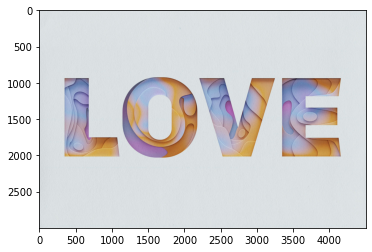

In [68]:
import cv2
import numpy as np
import pytesseract



#이미지를 불러와 gray 스케일로 변환해 준다.

image = cv2.imread(images_path[8])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#pytesseract에서는 numpy array를 읽지 못하고 file을 읽기 때문에 os로 파일을 불러들여야 한다.
filename = "{}.jpg".format(os.getpid())
cv2.imwrite(filename, gray)

#pytesseract의 image to string을 써준다. 
#숫자니까 lang = 'None'으로

text = pytesseract.image_to_string(Image.open(filename), lang = 'eng')
os.remove(filename)

#결과를 보자.

print(text)
plt.imshow(image)

In [33]:
corde = []
for i in dati[0].split()[1:5]:
    corde.append(int(i))

corde = tuple([corde[0], img.size[1]-corde[3], corde[2], img.size[1]-corde[1]])
im = img.crop(tuple(corde))

In [44]:
im.save(output_path + "as.png")

SystemError: tile cannot extend outside image

In [40]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python'
output_path = work_dir + '/output/' 

In [ ]:
테서렉트는 성능이 굉장히 좋지 않다
뭘해도 글자가 잡히지 않는다.

## 테스트 결과

## 결론

## 회고

1. OCR을 활용하여 구현하려는 서비스의 기획이 타당한가?  
목표로 하는 서비스가 OCR를 적용 가능하며, OCR을 활용했을 때 더욱 유용해진다.  
2. 모델 평가기준이 명확하고 체계적으로 세워졌는가?  
평가 기준에 부합하는 테스트 데이터의 특징이 무엇인지 명확하게 제시되었다.  
3. 평가기준에 따라 충분한 분량의 테스트가 진행되고 그 결과가 잘 정리되었는가?  
최대 20장까지의 테스트 이미지를 사용해 제시된 평가 기준에 따른 테스트 결과가 잘 정리되어 결론이 도출되었다.

## Reference

1. https://stackoverflow.com/questions/33187698/how-to-increase-thickness-of-polygon-in-pil-imagedraw
2. https://github.com/PEBpung/Aiffel/blob/master/Project/Exploration/E17.Compare%20OCR%20with%20OCR%20API%2C%20keras-ocr%2C%20Tesseract.ipynb
3. https://www.youtube.com/watch?v=6DjFscX4I_c